In [1]:
%pip install scikit-learn matplotlib numpy umap-learn

Defaulting to user installation because normal site-packages is not writeable
DEPRECATION: devscripts 2.22.1ubuntu1 has a non-standard version number. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of devscripts or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063
DEPRECATION: reportbug 11.4.1ubuntu1 has a non-standard version number. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of reportbug or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063
Note: you may need to restart the kernel to use updated packages.


# 1. REDUCCIÓN DE LA DIMENSIONALIDAD

## Paso 1 

Cargamos la data del archivo ipynb para utilizarlo en la lista data, de la extraction de los features vectors.

In [2]:
import os
import numpy as np
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import PCA
from sklearn.decomposition import FactorAnalysis
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
import pandas as pd
import random
import umap
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error

/home/andrewkc/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Al mismo tiempo que reduccimos la dimensionalidad generamos en y_train y y_validation con los labels cambiados a números.

**TRAIN SUBSET**

In [3]:
df_train = pd.read_csv('/home/andrewkc/Codes/ml-project-3/csv/m_train_subset.csv')
dict_yt_id_label_train = df_train.set_index('youtube_id')['label'].to_dict()
print(dict_yt_id_label_train)
print(len(dict_yt_id_label_train))

{'GcTww0NOCk0': 0, 'zeIkGEHK46I': 1, '-Fwy8NwefTk': 2, 'YYgESo5eQD8': 3, '38Ml6v4vPzY': 4, 'sDD0p8h88rI': 5, '09AinCnKAE8': 1, 'oSLF9nm-FsA': 0, 'qyTDZajMSqQ': 6, 'pRebkWHsHC0': 7, 'nGx0rZBQa84': 8, 'EFuWFeI2g6U': 9, 'I5Uv9aGiyOQ': 3, 'QpBihhfoqiA': 6, 'O8pbfj5KkaI': 4, 'yYCLK5m4hYw': 7, 'vDrA6LEFvUQ': 2, 'jNZq06PrwTM': 5, 'LJUeH2YMWN8': 0, 'C4Sv9AIOzCI': 5, 'YgYJGayETlI': 10, 'I7ZNgqUKjZ0': 11, 'nHC09bqk9u0': 12, 'LKzoGC1npcw': 6, 'BLHhmBU-Tts': 2, 'h8AGcIHRsoc': 4, '8vmr4mHxmks': 2, '8fSF6jCy7Qk': 13, 'ZEB0X4ojJbI': 11, 'QF0u6V3l5HI': 14, 'WxT0lvdXWms': 12, 'rIFZmnb-VsY': 15, 'dwCRDTaKZ8Y': 16, 'S7UXJIM8QpU': 6, 'xpx6ccaYIE4': 6, 'OiwxcoT2Xog': 8, 'fci8rGISpEA': 15, 'EFVkN6zUta0': 4, 'MGpIlEFl96Q': 16, 'gCtibUWTcYo': 17, 'ASMBCSQakUg': 0, 'uI2ANreTjsY': 16, 'yTWTgkRBGhM': 4, 'YkBH--lw1ww': 0, 'qsZ5OlG9GwA': 4, 'Csj1UUFQ30I': 18, 'bUPLq6grnjM': 11, 'hhtLeprzZ3w': 16, 'ozUoLCvr4-w': 1, '8psqhKdY0VU': 3, 'SX7xEsx7KPA': 16, 'zEQfwUvHdLI': 0, 'H9yPB3rWiFE': 3, 'LXFY4GoTlQI': 3, '4YK9k1RSC

In [4]:
folder_path = '/home/andrewkc/Projects/ml-p3/features_train/r21d/r2plus1d_18_16_kinetics'
data_list_train = []
y_train = []

for filename in os.listdir(folder_path):
    if filename.endswith('.npy'):
        yt_id = filename.split('_')[0]
        print(yt_id)
        y_train.append(dict_yt_id_label_train[yt_id])
        file_path = os.path.join(folder_path, filename)
        data = np.load(file_path)
        data_list_train.append(data)

print(data_list_train)
print(y_train)
print(len(data_list_train))
print(len(y_train))

G4A4EqFCfvg
HlkQXtggBsc
ML37dkA5LZE
DnF8xXkEvOQ
nNLSyQKs4Zg
8JDCp74fmUs
Se-AW79WKKE
U7V4LbsH8bI
yt6DHsvX0g8
ENgpwOAwH7I
txUt0i7KVu4
vrIw6E3KnSM
uHTieRD9Pcc
32DUb2AtnI4
Afct6DPTqKA
QFcSOUrO7gk
r9ctMdSNlRA
L56IpO5K06s
PwgXTxE29WI
z1P3kisboDA
z0BAmnpS6yw
bcWYw8Kcvog
mbefTU40c74
h0iJAY2kZUM
ZzZtqrG-ehg
gfYnQA2vXCM
DoGkiaRWPtc
FbOhHNNQ0c8
XXUAMAc61Qw
8o4Yc0ebeDY
d2433LVAAAE
uEU5N9cVxBE
Ac8Kq3dfsOI
mAcUVl3L2ds
xkiSeuC7ZAM
OtzPLyYv3Y0
J0bIGSPRSXQ
YZAbuT8IlTI
wmDV7pIv9V4
XQO-OsBgwy0
X1Seq1fepuA
V1UwDX01MUQ
5dVbruyVa3s
nw4jCocjZ3g
1XzuqBmJxK4
I8wSPaiFgII
zdmVHu-Mnv0
LYQQM1JG-2c
gU-nV4qfz8w
Kf8qJ4OBRuA
-c5ZxVi0ZME
ou4fnya9aws
8m5f7SFVbIQ
zI8rGSKkSng
5xgMjc8U54c
eNjUk4djhuc
NuV8PFN5BAQ
8eDV2NPrkHk
whZ92Bme-VQ
iz07lnyzK0s
KpmkizXiSUs
szY1TMJ0LAM
SRfgEMWzpig
rgsLlb8SrMc
f7-WJWgaGmk
xc9kQjiWrTU
pMxCd6OArlQ
Y0AcqxCxyxQ
qQBLiwKcL7k
yRFk-pMlxjY
eja5itv3EWo
x1xxK3CRMsc
a--pJcjIH-A
qZP-deIoMB4
DFOWXj9mwtE
g1ZoSd55pwo
ualj3YHLYD0
AdR80IgvmDM
VyfNHSkaZuA
Ynq41BdoEdg
CWScDgPenDk
LlD0pLNQrzU
speVH13op78
uaAs

**VALIDATION SUBSET**

In [5]:
df_val = pd.read_csv('/home/andrewkc/Codes/ml-project-3/csv/m_val_subset.csv')
dict_yt_id_label_val = df_val.set_index('youtube_id')['label'].to_dict()
print(dict_yt_id_label_val)
print(len(dict_yt_id_label_val))

{'QwxUvhD4ImM': 7, '9QMlwdR8Olg': 2, 'WNu0Rwwlruc': 4, 'X4GRjs1zoEs': 11, 'S7mydaX-7Uw': 12, 'hrO4O7beQyk': 3, 'J1vjG5Auq1Q': 11, 'Q5A9mYLWNHU': 7, 'gjZOxYv1Kcs': 9, 'fkSOwCyCmOo': 2, 'IoDjDQTv-q0': 14, 'uh11r4fTWt0': 9, 'eI69j2uheYo': 14, 'Xchd-YBUVY4': 13, 'COGhdOWHsKg': 17, 'NawmN0n7j64': 12, 'XmuouBFqreg': 19, 'w7j-Dh9Gt9I': 1, 'n6iUTAb7Ens': 2, '4Qtq6B0KXpU': 2, 'khvY9u8a07g': 18, 'aglpXyfqd-8': 4, 'NwLAP2x6p-I': 12, 'dBIP8UmnSf4': 16, '3pfkq-LmxGw': 17, 'dT0xlEDaXkY': 16, 'aW9nPGAdLkM': 9, '-iDQZbi59iY': 3, 'N-sNIOGkJLg': 1, 'TY7Bti-jizE': 13, 'wrtJGHPseR8': 8, 'TbpoEQ-hOe0': 12, 'DfjXZtIrWwg': 12, 'f2t9cniRD9I': 14, 'ZXGug8uaDco': 15, '6D1IfEQUIZQ': 17, 'y-HkIwa-jWM': 19, '-94nreFhQRg': 9, 'I-OtyZr1EmE': 16, 'Njz5MD-OJsU': 17, 'WKhhgitkvzQ': 3, 'zH2seyEaMZ8': 2, 'xg3LER6hB78': 6, 'brJ2L7pbeA0': 10, 'qDdi88ZfdSg': 2, 'n3IbRvlDanU': 12, 'P80cmUoGfZ0': 11, 'zNBieYzIbxk': 4, '4GIH3JYb6no': 16, 'JSwJhD3IOs8': 17, 'HeJ7huTXaQM': 8, 'Z2t-F5cubpk': 19, '5vhEonzSjvA': 7, '7Yatdqw5OUQ': 3

In [6]:
folder_path = '/home/andrewkc/Projects/ml-p3/features_val/r21d/r2plus1d_18_16_kinetics'
data_list_val = []
y_val = []

for filename in os.listdir(folder_path):
    if filename.endswith('.npy'):
        yt_id = filename.split('_')[0]
        print(yt_id)
        y_val.append(dict_yt_id_label_val[yt_id])
        file_path = os.path.join(folder_path, filename)
        data = np.load(file_path)
        data_list_val.append(data)

print(data_list_val)
print(y_val)
print(len(data_list_val))
print(len(y_val))

Wg1gfvy7TDQ
dhpzYm8xWYg
WiWGuBFHcuE
cAQriI9ceR4
Aw2OtZReLDk
VX2OSPXC07w
m2M4Z-ODpzw
nD1gdjdBFVA
ukfxgFvRVq8
ZF1tF7cR5BU
vr8vYGJRq0Q
V3rzNdo3LmQ
pt1LBx9oWQI
qf8uVI5dcHo
3bAsDxMwQ2Y
eZyO5rK7OvQ
ifW-F2koT4E
nH9TXvzNZSc
QTlNe4bh1KU
AFV8x8ezN8g
oJyfsivWegE
McyjPxIp1qA
zYjHJNadEj4
CKqsKhoJpOY
NwTz4keCqSg
X5wFhswsEd8
G5wT5KR5Hlc
vdZ8iGPCfD4
QQJ7gU1Ggn4
-LsQK3zOcwo
7zbUPkmMnr4
MTK1vO5gNK8
fUcxKEv63PE
IOsrEqzStgg
YYM0nLy1q2M
DWdHPMqmwwE
kkOxiyw1we0
RM7CbqpPMxw
X4GRjs1zoEs
TY7Bti-jizE
SRGvcE2jrKM
UFpdMfP3XPc
ip9qfm3bpA4
WvRk6MKG654
2CPJYaRJtvk
66s-z4goaqg
cyhmYWGPFdU
5FseJMPlgwU
JYLsoKZC6AE
bLuFiZDrt0o
tEmD7bOv-x4
06HBsMpx9SM
SEMmkjkcAKk
Wg1iL8qTK7s
O8sRoYXQ0PA
U0JAfqEak2c
GRa9CqLNj5o
T9N4c0gYKn0
RaAKqfzgFhU
PbQhcxB1cY4
0HydDezkSU0
-HutuMqTAPw
DX9eHEB8fJw
iW3x0sab7bs
EZXJ1eSjMUo
LHq0nfE8epY
QdxDCeiPdzU
u9G9RSgWqok
qtvsw6h3yQo
dT0xlEDaXkY
aIkVlJvMw00
Bx7yPCR2RGo
mWInhFxuJ7c
t98Cp71GPD8
ZXGug8uaDco
cYRWugor6nk
RdDYHGcKwbU
jZ-RKDUgTZc
xT-3l7RKzSA
PJYTfUJc0p8
oDDOMvWOOxU
Y9WjlhlcmJs
gWDyfGfWIqQ
usS8

**TEST SUBSET**

In [7]:
#df_test = pd.read_csv('/home/andrewkc/Codes/ml-project-3/csv/test_subset.csv')
df_test = pd.read_csv('/home/andrewkc/Codes/ml-project-3/csv/test_subset_10.csv')
arr_test = df_test['youtube_id'].to_list()
print(arr_test)
print(len(arr_test))

['oaVWnxlQOeo', '7zMBk9Zu9fY', 'DwPEZeX5WkA', 'bO1MW9Lq9Sg', 'TdBpD9Ccg9w', 'i8EJnqGvAsM', 'd1ubwKHoBgA', 'pzH-jgGdy6U', 'IWDtYgDAhxI', 'ecnNI6Jmi48', 'zHupv-ZNi0Y', 'hBlOKmcBZos', 'Z9guj-A3gc0', 'oesSMKWz8CY', 'Fcy3XSBWKy4', 'gNQyjpfDBoA', 'YtWrmMYVdTE', 'ag2wCXCGFTE', 'G48WzPLG6VE', '7aoMSiH8iVA', 'xK3dEIDufRU', 'K6oVoGChyjo', 'YLWtilVsugQ', 'QW4eIKLLxTI', 'vWJtXpvapSw', 'm4OEqGZ97Mw', 'Aaz9-GrU-QE', 'kAAisBxwF18', 'mpFAMP2Fx-Y', 'pzjijL-6-eM', 'mGP-3nf0biU', 'MvZfGebcfSE', 'lMtCSbOgIGA', '0DHdxqytNTo', 'rwYzkfDMDnY', 'qr7v725ljG8', 'fwX3dfWjonw', 'fn3hWtXRsgs', 'U0SxSqywTZs', 'EzXAge5oiak', 'x03GlOJVW6E', 'ks79p33C05o', 'crfcu0-LXI8', 'RUAdSIVneDw', 'EPuqSs90NZ0', 'VRSvF8vTCys', 'kgkcLpc7VH0', 'ner4eN63q5w', 'oG-lv1npw3k', '3z3ZFBlTOec', 'MNhecK8WV-w', '3jHZSHyqEiY', 'Vt44Dtj-rAE', 'W-2Ohisa0eI', 'RYk0UHpagVY', 'nPl4lW2IwyQ', 'Wl6JeIEhg7Q', '5-Q0k532xSA', '-BrNqmFy-6Y', 'gWEtrHOsV1s', '298yI5LPEyE', '2iUpLcGzFmA', '3kaNvFf9gQs', 'MN0IT8n68SM', 'dIegqnfLbLo', 'OnNGIJfNGKQ', 'xdN4FpM3

In [8]:
#folder_path = '/home/andrewkc/Projects/ml-p3/features_test/r21d/r2plus1d_18_16_kinetics'
folder_path = '/home/andrewkc/Projects/ml-p3/features_test_10'
data_list_test = []
arr_test_reorder = []

for filename in os.listdir(folder_path):
    if filename.endswith('.npy'):
        yt_id = filename.split('_')[0]
        print(yt_id)
        arr_test_reorder.append(yt_id)
        file_path = os.path.join(folder_path, filename)
        data = np.load(file_path)
        data_list_test.append(data)

print(data_list_test)
print(arr_test_reorder)
print(len(data_list_test))
print(len(arr_test_reorder))

uRRY2QHdaGw
cMYLkTxaeRc
PXWLk5rHLvo
7ZyOXj5TNew
fSM3tpsiVqI
j6vCXXaD4HA
3WnGZEI3ZQw
MHUowHQ3HBA
cv6jYz5UbkA
y35tHqjM22c
eoB8swFN8jw
3j4qATfX0xw
mybPRZJm42g
VWqNsvZaE0M
6hrI0-Zku9I
EdUFw47A0lk
LvPpvE-gJjM
QO2oL2dQSgg
R3J5hDL4xfk
LxizvTYS8cE
fp9p3wzZq1U
MgRU12wHgcs
Kj4v1bS6Ay4
2pIg3TM2dQ8
62HjZ1-LGDo
upa9PQmviqY
b9-9vfwjzak
2iUpLcGzFmA
9o9lrFVw834
3nPyAG-RbJg
KMgvnaaMLR4
yaMZvpaTqJE
2Cp9SekzsuY
zHupv-ZNi0Y
IA9Mser8Qsk
XvfFQn44bhA
kVxw6wkWkSg
9Gb-zye7lF0
WkpcynCpJvs
KF8q4Ae73Ac
HHSxme6Ch6E
uIxxIDfUawE
C0fjccjmlUA
gjvlCBnaKEw
cjKTSxO-Dc4
Aaz9-GrU-QE
JRTp6FTgsPE
5s-esJYUWTA
dGSSMlvko7Q
-J8jfO0Fp6M
Z8US9cm5oD0
A7WyrhHMpT8
Z0eWuVFxTy8
3OJaELmtCMk
0QEafK0vs4s
aSvtZIXG848
qvhtW7bDk2M
nEyJqYABo7E
-a1f1ikmdd8
fwX3dfWjonw
noTmj22nfxE
PSEgR2yQGGc
z0EwSmWQXqo
ALYO-F70Xto
FQnuWSxclgk
KzZJBNxbsAM
36SaGOCeFio
FeEPLDGLUnc
j3hEa-4x-X0
tITY5zfwbLI
uEKQtD2VACY
lwqjdAlasm4
3dCwAX2KIgc
sMX2cRfYAZ0
JQitCfvl3uE
-bGVnGCy2yY
4-zRuTD8SwA
b4DfEP37L60
oSwVhi8dN7E
rFEPHGwno-4
cGhHPAyocR4
pIY8jciYQM4
O4-xvjKrLqk
FHOj

In [10]:
print(data_list_train[0].shape)
print(data_list_val[0].shape)
print(data_list_test[0].shape)

(15, 512)
(18, 512)
(16, 512)


## Paso 2

Calculamos la varianza explicada para saber cuantos datos usamos, para obtener el mejor n_components en train subset. Luego usamos ese averege size para validation subset y test subset. Tambén aplicamos normalización.

**TRAIN SUBSET**

In [9]:
scaler = StandardScaler()

total_elements = sum(data.size for data in data_list_train)

# Tamaño promedio obtenido de los tamaños filas x columnas de cada vector caracteristico
# AVERAGE_SIZE
average_size = total_elements // len(data_list_train)

resized_data_list_train = []
for data in data_list_train:
    flat_data = data.flatten()
    if flat_data.size < average_size:
        padded_data = np.pad(flat_data, (0, average_size - flat_data.size), mode='constant')
    else:
        padded_data = flat_data[:average_size]
    resized_data_list_train.append(padded_data)

scaled_data_train = scaler.fit_transform(resized_data_list_train)

cov_matrix = np.cov(scaled_data_train.T)
singular_values = np.linalg.svd(scaled_data_train, full_matrices=False, compute_uv=False)
explained_variance_ratio = (singular_values ** 2) / np.sum(singular_values ** 2)
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
optimal_n_components = np.argmax(cumulative_variance_ratio >= 0.98) + 1
print(optimal_n_components)
print(average_size)

print(scaled_data_train)
print(scaled_data_train.shape)

2856
8132
[[-0.25557845  0.70907246  1.98502783 ... -0.82329057 -0.87142832
  -0.818815  ]
 [-0.34348746 -0.20733786 -0.41579207 ... -0.42995125 -0.76919779
  -0.58446623]
 [ 0.1783542   2.45766483  2.0290601  ... -0.82329057 -0.87142832
  -0.818815  ]
 ...
 [-1.03094961 -0.17642682 -0.24874263 ...  0.05144831  1.49271636
  -0.20344044]
 [ 0.23404627 -1.0596855   0.38146334 ... -0.82329057 -0.87142832
  -0.818815  ]
 [-1.03290743 -0.05827402 -1.15746872 ... -0.82329057 -0.87142832
  -0.818815  ]]
(10695, 8132)


**VALIDATION SUBSET**

In [10]:
scaler = StandardScaler()

resized_data_list_val = []
for data in data_list_val:
    flat_data = data.flatten()
    if flat_data.size < average_size:
        padded_data = np.pad(flat_data, (0, average_size - flat_data.size), mode='constant')
    else:
        padded_data = flat_data[:average_size]
    resized_data_list_val.append(padded_data)

scaled_data_val = scaler.fit_transform(resized_data_list_val)

print(scaled_data_val)
print(scaled_data_val.shape)

[[ 0.68874227 -0.82743013 -0.28867851 ...  1.88767971 -0.13520504
   2.98381456]
 [-1.06021105 -0.75816136 -0.80720078 ...  0.3161726   0.66892156
  -0.05559645]
 [-0.53686008 -0.8098578  -0.59923289 ...  0.53130476  0.48055116
   0.03968745]
 ...
 [ 0.86133528 -0.52011444  0.19083549 ...  1.5365383  -0.30730576
  -0.16343084]
 [-0.31469275 -0.80158005 -0.18138451 ...  0.64677154 -0.07694035
  -0.0204584 ]
 [ 0.03185582 -0.83191356  0.95172886 ... -0.11710804 -0.27247345
   1.64256442]]
(855, 8132)


**TEST SUBSET**

In [11]:
scaler = StandardScaler()

resized_data_list_test = []
for data in data_list_test:
    flat_data = data.flatten()
    if flat_data.size < average_size:
        padded_data = np.pad(flat_data, (0, average_size - flat_data.size), mode='constant')
    else:
        padded_data = flat_data[:average_size]
    resized_data_list_test.append(padded_data)

scaled_data_test = scaler.fit_transform(resized_data_list_test)

print(scaled_data_test)
print(scaled_data_test.shape)

[[ 0.74479817 -0.17735155 -0.72531691 ... -0.35850356  0.28908783
  -0.441404  ]
 [-0.53935204 -0.06980786  0.1740808  ...  0.6638002   0.96766124
  -0.29908931]
 [-0.98855375 -0.53999472  0.04722702 ... -0.79873848 -0.80266774
  -0.79735514]
 ...
 [-0.72276169 -0.76768235 -0.6532981  ...  0.88036332  1.4961464
   1.01169643]
 [ 0.15935783  0.1452584   1.44068338 ... -0.79873848 -0.80266774
  -0.79735514]
 [ 0.67278993 -0.16605106 -0.50474142 ...  0.77253392  1.12811759
  -0.01858485]]
(805, 8132)


## Paso 3
Usamos los siguientes métodos de reducción de la dimensionalidad.

**SVD Principal Components**

In [142]:
# TRAIN SUBSET
svd_train = TruncatedSVD(n_components=optimal_n_components)
svd_principal_components_train = svd_train.fit_transform(scaled_data_train)
svd_reconstructed_data_train = np.dot(svd_principal_components_train, svd_train.components_)
svd_reconstruction_error = np.linalg.norm(scaled_data_train - svd_reconstructed_data_train, 'fro')
print(svd_reconstruction_error)
print("Componentes principales obtenidos:")
print(svd_principal_components_train)

1325.407710710926
Componentes principales obtenidos:
[[ 2.41999324e+01 -2.57114972e+01 -3.23383314e+01 ... -3.76383198e-01
  -4.52288785e-01  5.04923360e-01]
 [ 9.50093499e+00 -1.94915739e+01  2.25618215e+01 ...  2.52647483e-01
  -3.68213803e-01  5.43524922e-02]
 [ 1.18589669e+01 -3.54542469e+01 -2.31125287e+01 ... -9.91396905e-02
  -4.79642503e-01 -4.73769787e-01]
 ...
 [ 2.16834587e+01 -1.32877105e+01  9.42618886e+00 ...  4.85146821e-01
  -3.23207225e-01 -1.68187719e-01]
 [ 9.16974671e+00  8.66822419e+00 -7.48611915e+00 ...  2.20352585e-02
  -1.31485278e-01  3.38565397e-01]
 [ 1.07176619e+01  1.56024166e+01 -7.00113722e+00 ...  1.57494579e-01
  -3.13426449e-02  3.45298117e-01]]


In [143]:
# VALIDATION SUBSET
svd_val = TruncatedSVD(n_components=optimal_n_components)
svd_principal_components_val = svd_val.fit_transform(scaled_data_val)
svd_reconstructed_data_val = np.dot(svd_principal_components_val, svd_val.components_)
svd_reconstruction_error = np.linalg.norm(scaled_data_val - svd_reconstructed_data_val, 'fro')
print(svd_reconstruction_error)
print("Componentes principales obtenidos:")
print(svd_principal_components_val)

6.756476110103771e-11
Componentes principales obtenidos:
[[ 1.10227403e+01 -2.27335086e+01 -7.08386218e-01 ... -1.14682030e-01
  -1.79153064e-01  9.71445147e-17]
 [ 1.23038693e+00  2.42200493e+01  5.70332655e+00 ...  1.13297854e+00
  -1.46816003e-01 -4.57966998e-16]
 [-3.10976703e+01 -7.75074783e+00  1.85410686e+01 ...  1.26228060e-01
   9.17528771e-02  4.55885329e-15]
 ...
 [ 5.24209958e+00 -1.93724591e+01 -1.98621924e+01 ... -2.09548557e-01
   2.31612150e-01 -3.92741395e-15]
 [ 1.05381947e+01  2.43769623e+01  1.77045043e+00 ...  1.65270658e+00
  -4.05489252e-01 -2.60902411e-15]
 [ 1.16160258e+01 -2.87895667e+01 -1.80240917e+01 ...  4.94312652e-02
   1.51617868e-01 -2.06779038e-15]]


In [201]:
# TEST SUBSET
svd_test = TruncatedSVD(n_components=optimal_n_components)
svd_principal_components_test = svd_test.fit_transform(scaled_data_test)
svd_reconstructed_data_test = np.dot(svd_principal_components_test, svd_test.components_)
svd_reconstruction_error = np.linalg.norm(scaled_data_test - svd_reconstructed_data_test, 'fro')
print(svd_reconstruction_error)
print("Componentes principales obtenidos:")
print(svd_principal_components_test)

6.554301033962287e-11
Componentes principales obtenidos:
[[ 2.39904613e+01 -1.54877020e+01 -5.66397256e-01 ... -1.86666916e-01
   5.89259163e-02  3.88578059e-16]
 [ 2.83753882e+01 -1.71370918e+01 -9.78957847e+00 ... -3.58473304e-01
   9.44171952e-02 -1.34614542e-15]
 [-3.08485905e+01  2.28465169e+01  3.91979218e+01 ... -1.45700972e-01
  -3.45216063e-02 -6.03683770e-16]
 ...
 [ 2.01884214e+01 -6.96144348e+00 -3.64702972e+00 ...  4.42961668e-01
   1.92753652e-02 -1.60982339e-15]
 [-5.17099518e+01 -5.52573942e+00  1.84499660e+01 ... -4.51853965e-01
  -1.70068515e-02 -3.24046345e-15]
 [ 2.69602384e+01 -2.04867157e+01 -2.55974873e+01 ... -1.14692757e-02
  -7.44271800e-02  1.80411242e-15]]


**PCA Principal Components**

In [145]:
# TRAIN SUBSET
# En PCA el valor debe ser como máximo min(n_samples, n_features)=855.
pca_train = PCA(n_components=855)
pca_principal_components_train = pca_train.fit_transform(scaled_data_train)
pca_reconstructed_data_train = np.dot(pca_principal_components_train, pca_train.components_)
pca_reconstruction_error = np.linalg.norm(scaled_data_train - pca_reconstructed_data_train, 'fro')
print(pca_reconstruction_error)
print("Componentes principales obtenidos:")
print(pca_principal_components_train)

3140.788897133263
Componentes principales obtenidos:
[[ 24.19993238 -25.7114972  -32.33833143 ...   0.95956251   0.84315527
    0.47149394]
 [  9.50093499 -19.49157393  22.56182147 ...   0.22762324   0.77301736
   -1.53957034]
 [ 11.85896685 -35.45424686 -23.11252869 ...  -0.67391962   0.514552
    0.92685929]
 ...
 [ 21.68345874 -13.28771049   9.42618886 ...   0.43611597   0.695277
    0.94186199]
 [  9.16974671   8.66822419  -7.48611915 ...   2.10190136  -0.30926655
   -0.47066658]
 [ 10.71766187  15.60241659  -7.00113722 ...  -0.87230863  -1.96085615
    2.31157663]]


In [146]:
# VALIDATION SUBSET
# En PCA el valor debe ser como máximo min(n_samples, n_features)=855.
pca_val = PCA(n_components=855)
pca_principal_components_val = pca_val.fit_transform(scaled_data_val)
pca_reconstructed_data_val = np.dot(pca_principal_components_val, pca_val.components_)
pca_reconstruction_error = np.linalg.norm(scaled_data_val - pca_reconstructed_data_val, 'fro')
print(pca_reconstruction_error)
print("Componentes principales obtenidos:")
print(pca_principal_components_val)

7.864570990986154e-12
Componentes principales obtenidos:
[[ 1.10227403e+01 -2.27335086e+01 -7.08386218e-01 ... -1.14682030e-01
  -1.79153064e-01  2.99078826e-15]
 [ 1.23038693e+00  2.42200493e+01  5.70332655e+00 ...  1.13297854e+00
  -1.46816003e-01  2.99078826e-15]
 [-3.10976703e+01 -7.75074783e+00  1.85410686e+01 ...  1.26228060e-01
   9.17528771e-02  2.99078826e-15]
 ...
 [ 5.24209958e+00 -1.93724591e+01 -1.98621924e+01 ... -2.09548557e-01
   2.31612150e-01  2.99078826e-15]
 [ 1.05381947e+01  2.43769623e+01  1.77045043e+00 ...  1.65270658e+00
  -4.05489252e-01  2.99078826e-15]
 [ 1.16160258e+01 -2.87895667e+01 -1.80240917e+01 ...  4.94312652e-02
   1.51617868e-01  2.99078826e-15]]


In [147]:
# TEST SUBSET
# En PCA el valor debe ser como máximo min(n_samples, n_features)=855.
pca_test = PCA(n_components=855)
pca_principal_components_test = pca_test.fit_transform(scaled_data_test)
pca_reconstructed_data_test = np.dot(pca_principal_components_test, pca_test.components_)
pca_reconstruction_error = np.linalg.norm(scaled_data_test - pca_reconstructed_data_test, 'fro')
print(pca_reconstruction_error)
print("Componentes principales obtenidos:")
print(pca_principal_components_test)

764.7626223738789
Componentes principales obtenidos:
[[ 1.37916625e+01 -2.55171367e+01  2.27908111e-01 ...  5.22127197e-01
  -1.42952636e+00  1.03707764e+00]
 [ 1.57698837e+01  1.31213849e+01 -2.02300866e+01 ...  1.55351612e+00
  -6.35487835e-01  4.93080735e-01]
 [ 2.27527254e+01  1.49715828e+01 -6.67962933e+00 ... -2.51515559e+00
  -4.06287827e-01  6.87367114e-01]
 ...
 [-5.30563300e+01  3.62128318e+00  2.45639240e+01 ...  1.07949857e+00
   8.73808517e-01 -1.39338008e+00]
 [ 2.58357615e+01  2.84118239e+01 -2.18585021e+01 ...  4.38485023e-01
   2.06260545e-01  2.02770855e+00]
 [ 8.69350533e+00 -3.49509327e+00  1.01258180e+01 ...  3.54361598e-02
   7.85812608e-01 -4.57725653e-02]]


**FA Principal Components**

In [148]:
# TRAIN SUBSET
fa_train = FactorAnalysis(n_components=optimal_n_components)
fa_principal_components_train = fa_train.fit_transform(scaled_data_train)
fa_reconstructed_data_train = np.dot(fa_principal_components_train, fa_train.components_)
fa_reconstruction_error = np.linalg.norm(scaled_data_train - fa_reconstructed_data_train, 'fro')
print(fa_reconstruction_error)
print("Componentes principales obtenidos:")
print(fa_principal_components_train)

1387.6986248727508
Componentes principales obtenidos:
[[-0.99719961 -1.45590408  1.50773948 ...  0.51060427 -1.47695676
  -0.00328711]
 [-0.25867846 -1.08101668 -1.04651146 ... -1.3293711   0.29136468
   0.30293337]
 [-0.47153471 -1.98676026  1.51462247 ... -0.5216421  -1.75812417
   0.07261648]
 ...
 [-0.70629488 -0.67781137 -0.31995051 ...  0.8209666  -1.49345236
  -0.64727811]
 [-0.4417852   0.4846646   0.00470758 ... -0.28246476  1.365225
  -1.37825868]
 [-0.5096043   0.96757899  1.19257257 ...  0.16625019 -0.19918789
   0.5008565 ]]


In [149]:
# VALIDATION SUBSET
fa_val = FactorAnalysis(n_components=optimal_n_components)
fa_principal_components_val = fa_val.fit_transform(scaled_data_val)
fa_reconstructed_data_val = np.dot(fa_principal_components_val, fa_val.components_)
fa_reconstruction_error = np.linalg.norm(scaled_data_val - fa_reconstructed_data_val, 'fro')
print(fa_reconstruction_error)
print("Componentes principales obtenidos:")
print(fa_principal_components_val)

6.157477384932375e-10
Componentes principales obtenidos:
[[-0.40347903  1.32150258 -0.04976779 ...  0.18511423  0.33571844
   0.        ]
 [-0.04503738 -1.40791544  0.40068813 ... -1.82879954  0.27512139
   0.        ]
 [ 1.13830659  0.45055224  1.30260576 ... -0.20375127 -0.17193752
   0.        ]
 ...
 [-0.19188307  1.12612423 -1.39542153 ...  0.33824322 -0.43402255
   0.        ]
 [-0.38574261 -1.41703682  0.12438328 ... -2.66771959  0.75985426
   0.        ]
 [-0.4251958   1.67354223 -1.26628547 ... -0.07978957 -0.2841197
   0.        ]]


In [150]:
# TEST SUBSET
fa_test = FactorAnalysis(n_components=optimal_n_components)
fa_principal_components_test = fa_test.fit_transform(scaled_data_test)
fa_reconstructed_data_test = np.dot(fa_principal_components_test, fa_test.components_)
fa_reconstruction_error = np.linalg.norm(scaled_data_test - fa_reconstructed_data_test, 'fro')
print(fa_reconstruction_error)
print("Componentes principales obtenidos:")
print(fa_principal_components_test)

2.0902660345010636e-09
Componentes principales obtenidos:
[[-0.44136601 -1.54361929  0.01543811 ...  0.01640708  0.19301494
   0.        ]
 [-0.5046738   0.79375766 -1.37035172 ... -0.50880989  0.25698135
   0.        ]
 [-0.72814135  0.90568249 -0.45246675 ... -0.21905079 -0.0803176
   0.        ]
 ...
 [ 1.69792879  0.21906386  1.6639185  ... -0.13335196  0.28161332
   0.        ]
 [-0.82680584  1.71872886 -1.48065782 ...  0.26789353 -0.07061651
   0.        ]
 [-0.27821285 -0.2114302   0.68590572 ...  0.12048882  0.40281099
   0.        ]]


**UMAP Principal Components**

In [13]:
# TRAIN SUBSET
umap_train = umap.UMAP(n_components=3)
umap_embedding_train = umap_train.fit_transform(scaled_data_train)
# umap_embedding now contains the reduced dimensions (2D or 3D)
print(umap_embedding_train)
# Entrenar el modelo inverso (regresión de red neuronal)
inverse_model = MLPRegressor(hidden_layer_sizes=(100, 100), max_iter=500, random_state=42)
inverse_model.fit(umap_embedding_train, scaled_data_train)
# Reconstruir los datos desde el espacio UMAP
umap_reconstructed_train = inverse_model.predict(umap_embedding_train)
# Calcular el error de reconstrucción
reconstruction_error = mean_squared_error(scaled_data_train, umap_reconstructed_train)
print(f"Reconstruction Error: {reconstruction_error}")

[[ 9.548338    8.05667     0.24958135]
 [-0.62608916  9.707898   10.133933  ]
 [ 2.6574113   7.873102   -0.10237557]
 ...
 [ 3.82194    -1.443586    8.98331   ]
 [ 9.379001    7.5517445   7.4860163 ]
 [ 9.24227     5.3970118  14.599519  ]]
Reconstruction Error: 0.6318007024031705


In [14]:
# VALIDATION SUBSET
umap_val = umap.UMAP(n_components=3)
umap_embedding_val = umap_val.fit_transform(scaled_data_val)
# umap_embedding now contains the reduced dimensions (2D or 3D)
print(umap_embedding_val)
# Entrenar el modelo inverso (regresión de red neuronal)
inverse_model = MLPRegressor(hidden_layer_sizes=(100, 100), max_iter=500, random_state=42)
inverse_model.fit(umap_embedding_val, scaled_data_val)
# Reconstruir los datos desde el espacio UMAP
umap_reconstructed_val = inverse_model.predict(umap_embedding_val)
# Calcular el error de reconstrucción
reconstruction_error = mean_squared_error(scaled_data_val, umap_reconstructed_val)
print(f"Reconstruction Error: {reconstruction_error}")

[[ 8.647034  10.228531   4.8826   ]
 [ 8.268371   3.9896672  5.126663 ]
 [ 8.331464   8.721359   4.108101 ]
 ...
 [ 8.281642  11.255499   2.9268165]
 [ 8.279653   3.835651   5.1782913]
 [ 8.305225  11.223877   2.8816786]]
Reconstruction Error: 0.7162647014529203


In [15]:
# TEST SUBSET
umap_test = umap.UMAP(n_components=3)
umap_embedding_test = umap_test.fit_transform(scaled_data_test)
# umap_embedding now contains the reduced dimensions (2D or 3D)
print(umap_embedding_test)
# Entrenar el modelo inverso (regresión de red neuronal)
inverse_model = MLPRegressor(hidden_layer_sizes=(100, 100), max_iter=500, random_state=42)
inverse_model.fit(umap_embedding_test, scaled_data_test)
# Reconstruir los datos desde el espacio UMAP
umap_reconstructed_test = inverse_model.predict(umap_embedding_test)
# Calcular el error de reconstrucción
reconstruction_error = mean_squared_error(scaled_data_test, umap_reconstructed_test)
print(f"Reconstruction Error: {reconstruction_error}")

[[ 9.021279  10.111038   3.7943878]
 [ 8.644529   9.907752   4.6287293]
 [ 2.5322275  3.4647362  3.7026718]
 ...
 [ 7.343154   8.269403   5.4398193]
 [ 1.2963237  3.2983212  4.047902 ]
 [ 8.87342   10.168288   4.0720835]]
Reconstruction Error: 0.7262225511005845


Gráficas para la data train

In [178]:
scaled_data = scaled_data_train
svd_principal_components = svd_principal_components_train
pca_principal_components = pca_principal_components_train
fa_principal_components = fa_principal_components_train
svd_reconstructed = svd_reconstructed_data_train
pca_reconstructed = pca_reconstructed_data_train
fa_reconstructed = fa_reconstructed_data_train
umap_reconstructed = umap_reconstructed_train

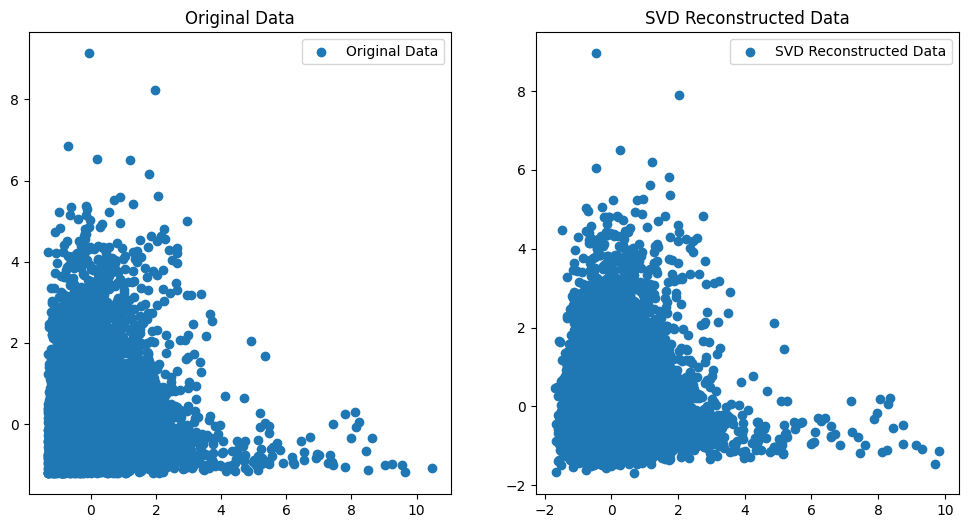

In [31]:
# Visualizar las primeras dos dimensiones de la reconstrucción
plt.figure(figsize=(12, 6))

# Datos originales
plt.subplot(1, 2, 1)
plt.scatter(scaled_data[:, 0], scaled_data[:, 1], label='Original Data')
plt.title('Original Data')
plt.legend()

plt.subplot(1, 2, 2)
plt.scatter(svd_reconstructed[:, 0], svd_reconstructed[:, 1], label='SVD Reconstructed Data')
plt.title('SVD Reconstructed Data')
plt.legend()

plt.show()

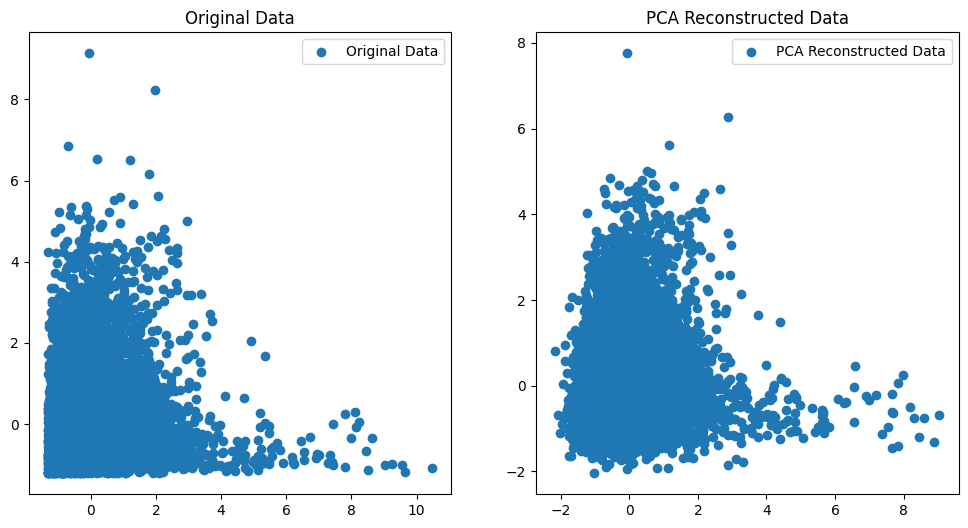

In [32]:
# Visualizar las primeras dos dimensiones de la reconstrucción
plt.figure(figsize=(12, 6))

# Datos originales
plt.subplot(1, 2, 1)
plt.scatter(scaled_data[:, 0], scaled_data[:, 1], label='Original Data')
plt.title('Original Data')
plt.legend()

plt.subplot(1, 2, 2)
plt.scatter(pca_reconstructed[:, 0], pca_reconstructed[:, 1], label='PCA Reconstructed Data')
plt.title('PCA Reconstructed Data')
plt.legend()

plt.show()

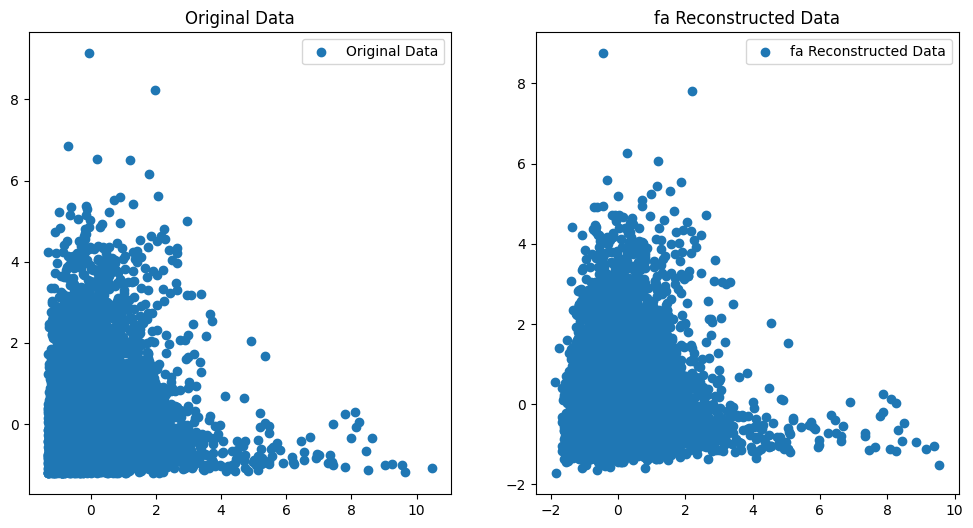

In [33]:
# Visualizar las primeras dos dimensiones de la reconstrucción
plt.figure(figsize=(12, 6))

# Datos originales
plt.subplot(1, 2, 1)
plt.scatter(scaled_data[:, 0], scaled_data[:, 1], label='Original Data')
plt.title('Original Data')
plt.legend()

plt.subplot(1, 2, 2)
plt.scatter(fa_reconstructed[:, 0], fa_reconstructed[:, 1], label='fa Reconstructed Data')
plt.title('fa Reconstructed Data')
plt.legend()

plt.show()

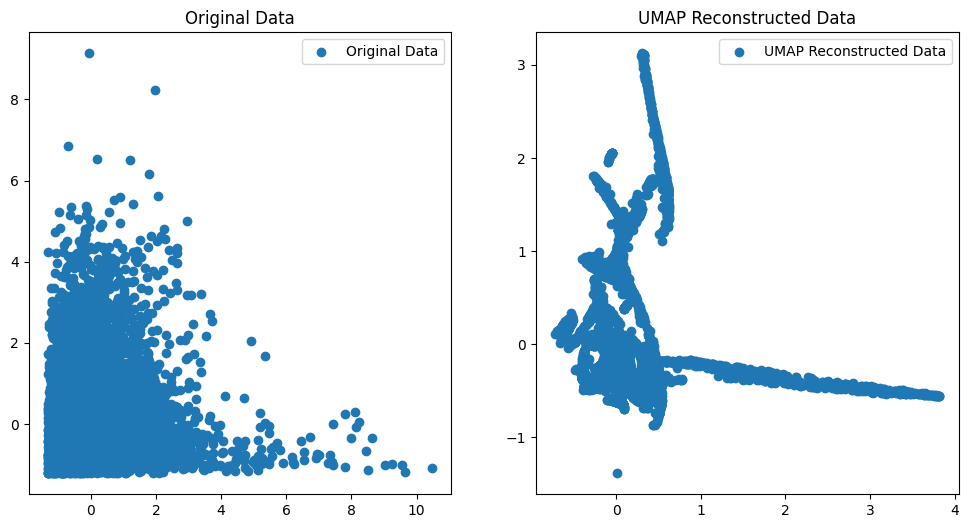

In [34]:
plt.figure(figsize=(12, 6))

# Datos originales
plt.subplot(1, 2, 1)
plt.scatter(scaled_data[:, 0], scaled_data[:, 1], label='Original Data')
plt.title('Original Data')
plt.legend()

# Datos reconstruidos
plt.subplot(1, 2, 2)
plt.scatter(umap_reconstructed[:, 0], umap_reconstructed[:, 1], label='UMAP Reconstructed Data')
plt.title('UMAP Reconstructed Data')
plt.legend()

plt.show()

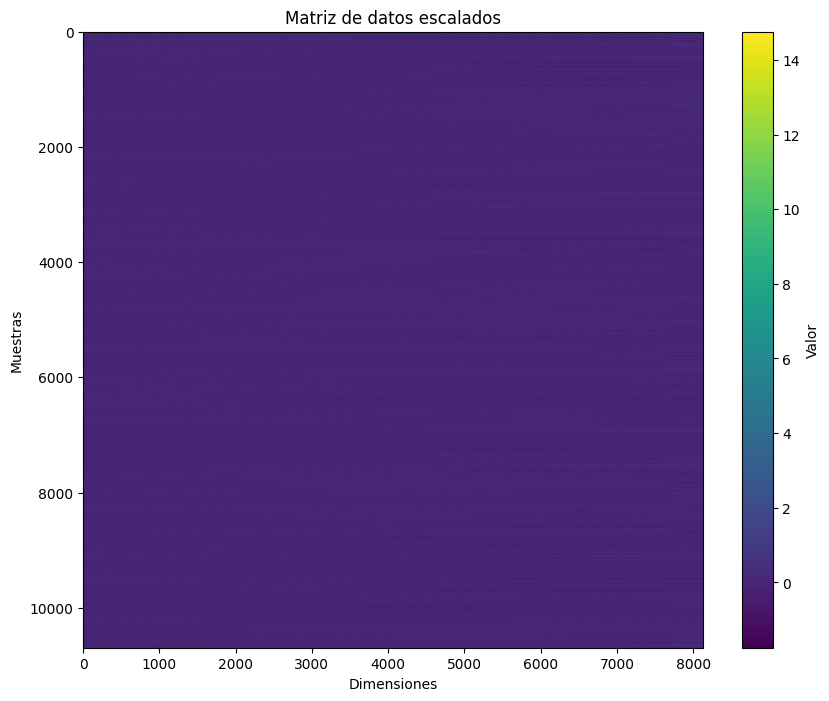

In [41]:
plt.figure(figsize=(10, 8))
plt.imshow(scaled_data, cmap='viridis', aspect='auto')
plt.colorbar(label='Valor')
plt.title('Matriz de datos escalados')
plt.xlabel('Dimensiones')
plt.ylabel('Muestras')
plt.show()

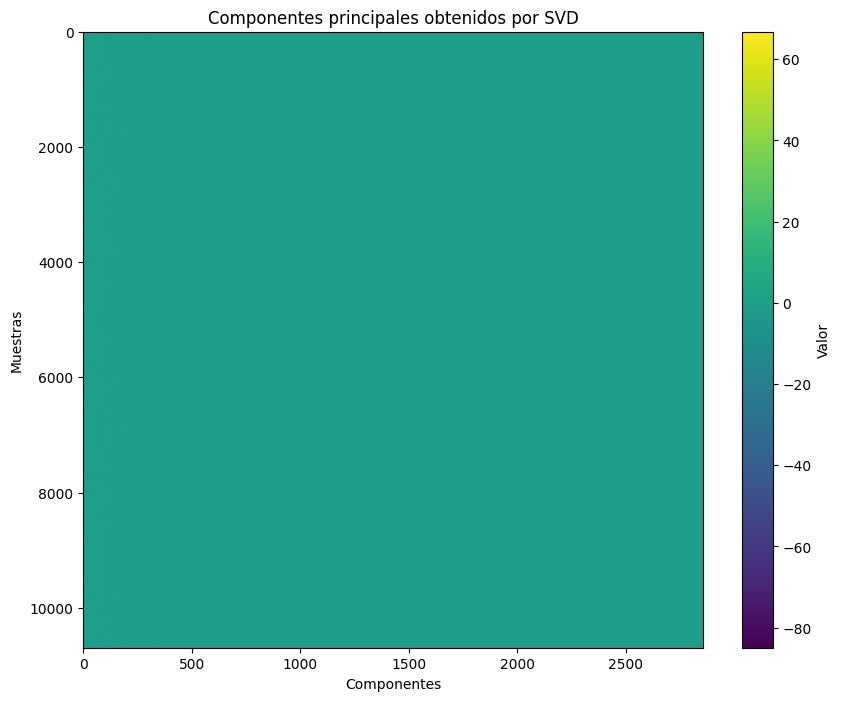

In [36]:

plt.figure(figsize=(10, 8))
plt.imshow(svd_principal_components, cmap='viridis', aspect='auto')
plt.colorbar(label='Valor')
plt.title('Componentes principales obtenidos por SVD')
plt.xlabel('Componentes')
plt.ylabel('Muestras')
plt.show()

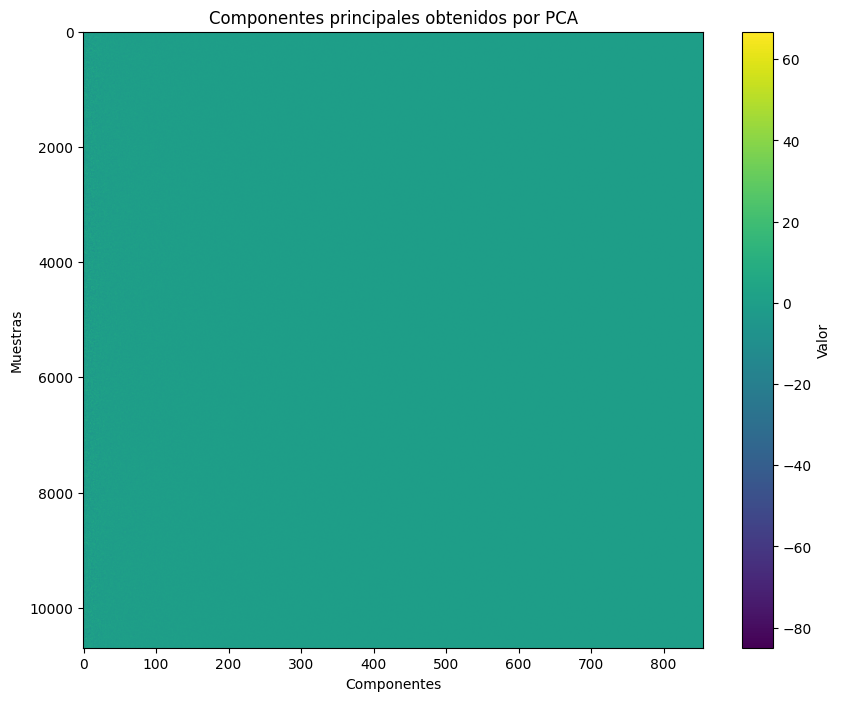

In [37]:

plt.figure(figsize=(10, 8))
plt.imshow(pca_principal_components, cmap='viridis', aspect='auto')
plt.colorbar(label='Valor')
plt.title('Componentes principales obtenidos por PCA')
plt.xlabel('Componentes')
plt.ylabel('Muestras')
plt.show()

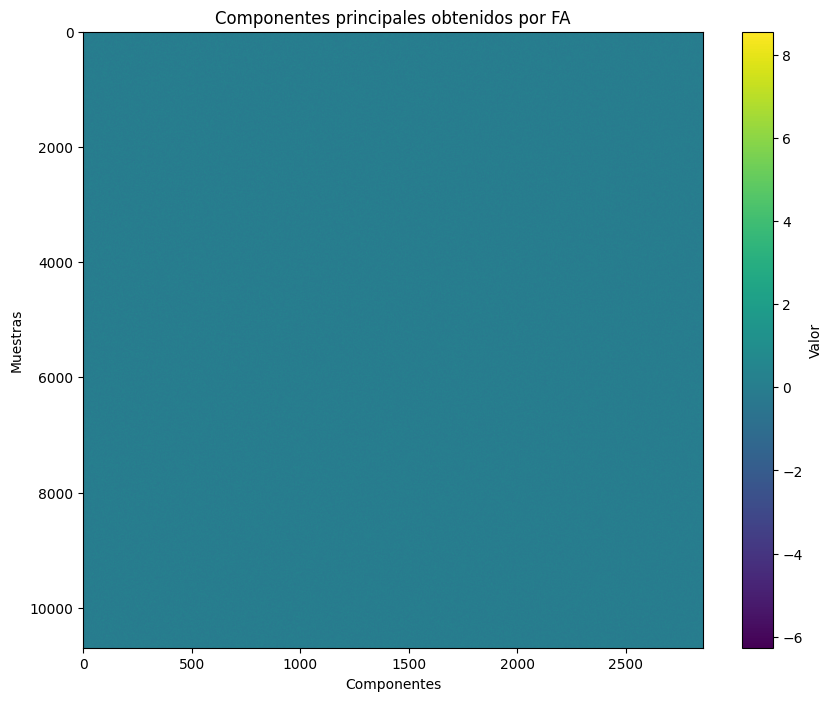

In [38]:

plt.figure(figsize=(10, 8))
plt.imshow(fa_principal_components, cmap='viridis', aspect='auto')
plt.colorbar(label='Valor')
plt.title('Componentes principales obtenidos por FA')
plt.xlabel('Componentes')
plt.ylabel('Muestras')
plt.show()

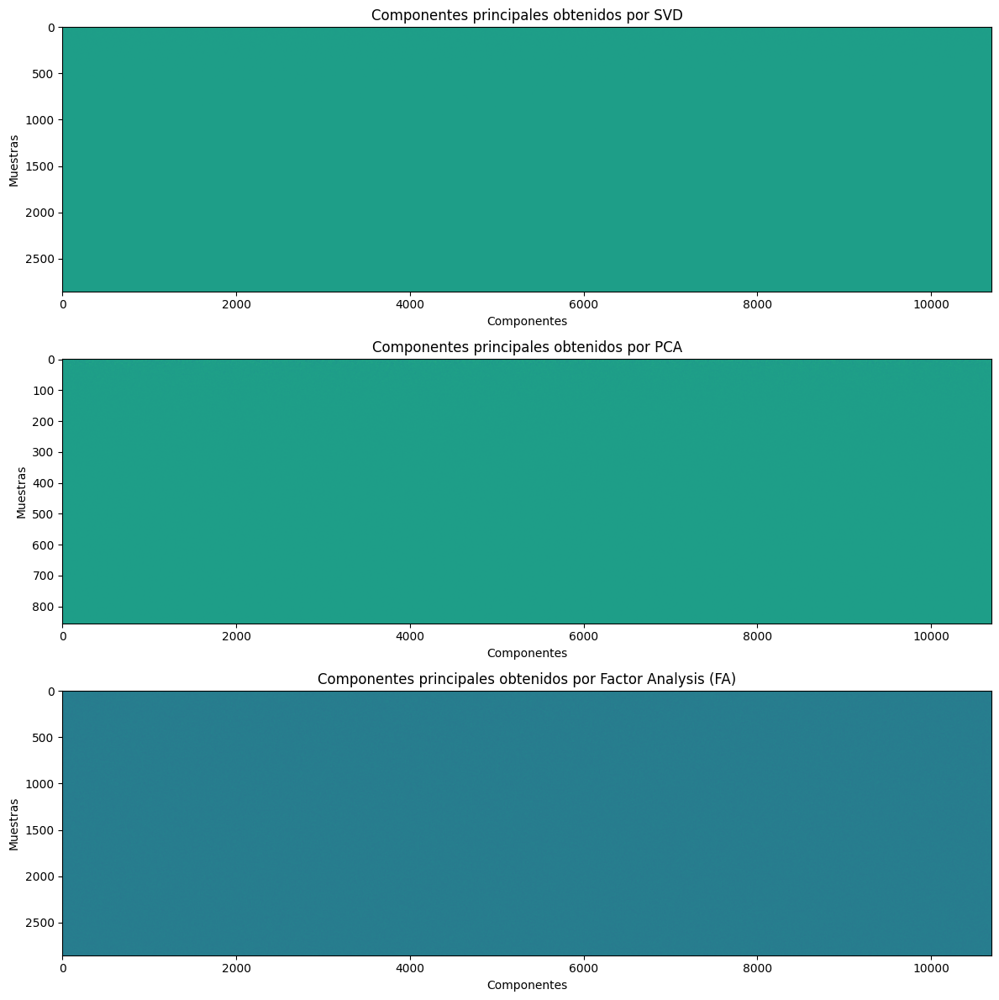

In [39]:

fig, axes = plt.subplots(3, 1, figsize=(12, 12))

# Plot para SVD
axes[0].imshow(svd_principal_components.T, cmap='viridis', aspect='auto')
axes[0].set_title('Componentes principales obtenidos por SVD')
axes[0].set_xlabel('Componentes')
axes[0].set_ylabel('Muestras')

# Plot para PCA
axes[1].imshow(pca_principal_components.T, cmap='viridis', aspect='auto')
axes[1].set_title('Componentes principales obtenidos por PCA')
axes[1].set_xlabel('Componentes')
axes[1].set_ylabel('Muestras')

# Plot para Factor Analysis (FA)
axes[2].imshow(fa_principal_components.T, cmap='viridis', aspect='auto')
axes[2].set_title('Componentes principales obtenidos por Factor Analysis (FA)')
axes[2].set_xlabel('Componentes')
axes[2].set_ylabel('Muestras')

plt.tight_layout()
plt.show()

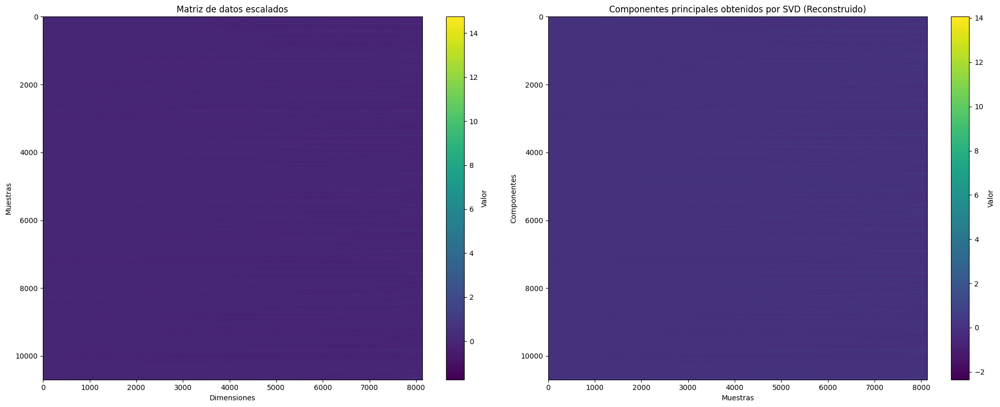

In [40]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

im1 = ax1.imshow(scaled_data, cmap='viridis', aspect='auto')
ax1.set_title('Matriz de datos escalados')
ax1.set_xlabel('Dimensiones')
ax1.set_ylabel('Muestras')
fig.colorbar(im1, ax=ax1, label='Valor')

im2 = ax2.imshow(svd_reconstructed, cmap='viridis', aspect='auto')
ax2.set_title('Componentes principales obtenidos por SVD (Reconstruido)')
ax2.set_xlabel('Muestras')
ax2.set_ylabel('Componentes')
fig.colorbar(im2, ax=ax2, label='Valor')

plt.tight_layout()

plt.show()

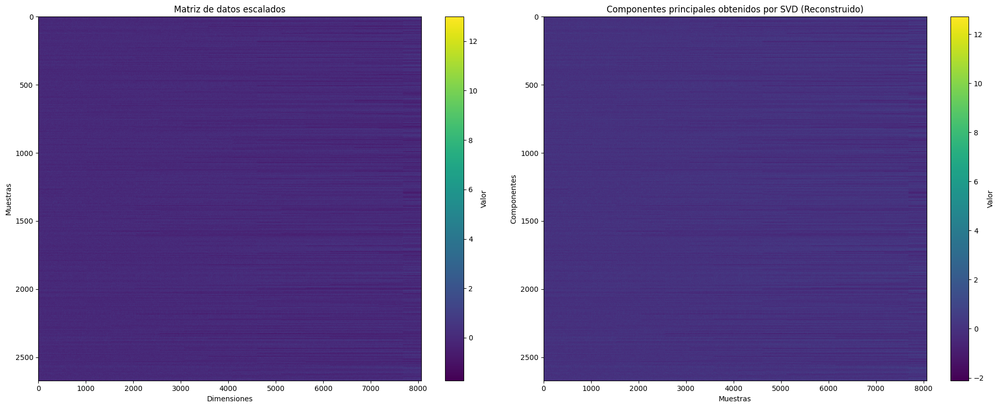

In [13]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

im1 = ax1.imshow(scaled_data, cmap='viridis', aspect='auto')
ax1.set_title('Matriz de datos escalados')
ax1.set_xlabel('Dimensiones')
ax1.set_ylabel('Muestras')
fig.colorbar(im1, ax=ax1, label='Valor')

im2 = ax2.imshow(pca_reconstructed, cmap='viridis', aspect='auto')
ax2.set_title('Componentes principales obtenidos por SVD (Reconstruido)')
ax2.set_xlabel('Muestras')
ax2.set_ylabel('Componentes')
fig.colorbar(im2, ax=ax2, label='Valor')

plt.tight_layout()

plt.show()

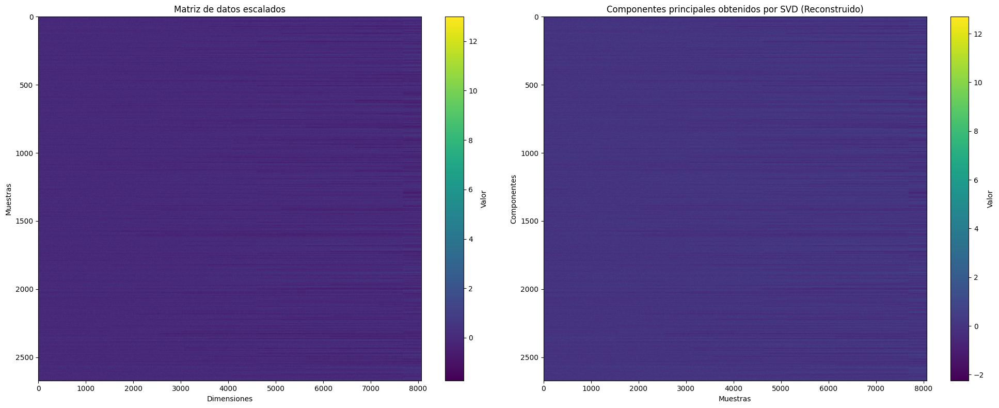

In [14]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

im1 = ax1.imshow(scaled_data, cmap='viridis', aspect='auto')
ax1.set_title('Matriz de datos escalados')
ax1.set_xlabel('Dimensiones')
ax1.set_ylabel('Muestras')
fig.colorbar(im1, ax=ax1, label='Valor')

im2 = ax2.imshow(fa_reconstructed, cmap='viridis', aspect='auto')
ax2.set_title('Componentes principales obtenidos por SVD (Reconstruido)')
ax2.set_xlabel('Muestras')
ax2.set_ylabel('Componentes')
fig.colorbar(im2, ax=ax2, label='Valor')

plt.tight_layout()

plt.show()

# 2. MÉTODOS DE CLUSTERING

## 2.1. KMEANS

In [16]:
import random
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

class KMeans:
    def __init__(self, data, k):
        self.data = data
        self.k = k
        self.centroids = None

    def initialize_centroids(self):
        if self.k > self.data.shape[0]:
            raise ValueError("El número de clusters no puede ser mayor que el número de puntos de datos.")
        indices = random.sample(range(self.data.shape[0]), self.k)
        centroids = self.data[indices]
        return centroids

    def assign_clusters(self, centroids):
        clusters = {}
        for x in self.data:
            distances = np.linalg.norm(x - centroids, axis=1)
            cluster = np.argmin(distances)
            if cluster not in clusters:
                clusters[cluster] = []
            clusters[cluster].append(x)
        return clusters

    def update_centroids(self, clusters):
        centroids = np.zeros((self.k, self.data.shape[1]))
        for cluster in clusters:
            centroids[cluster] = np.mean(clusters[cluster], axis=0)
        return centroids

    def fit(self, max_iterations=100):
        self.centroids = self.initialize_centroids()
        for _ in range(max_iterations):
            clusters = self.assign_clusters(self.centroids)
            new_centroids = self.update_centroids(clusters)
            if np.all(self.centroids == new_centroids):
                break
            self.centroids = new_centroids
        return self.centroids, clusters

    def predict(self, vector):
        if self.centroids is None:
            raise ValueError("El modelo KMeans no ha sido entrenado aún.")
        distances = np.linalg.norm(vector - self.centroids, axis=1)
        cluster = np.argmin(distances)
        return cluster

In [64]:
import random
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, adjusted_rand_score, adjusted_mutual_info_score

class KMeans:
    def __init__(self, data, k):
        self.data = data
        self.k = k
        self.centroids = None

    def initialize_centroids(self):
        if self.k > self.data.shape[0]:
            raise ValueError("El número de clusters no puede ser mayor que el número de puntos de datos.")
        indices = random.sample(range(self.data.shape[0]), self.k)
        centroids = self.data[indices]
        return centroids

    def assign_clusters(self, centroids):
        clusters = {}
        for x in self.data:
            distances = np.linalg.norm(x - centroids, axis=1)
            cluster = np.argmin(distances)
            if cluster not in clusters:
                clusters[cluster] = []
            clusters[cluster].append(x)
        return clusters

    def update_centroids(self, clusters):
        centroids = np.zeros((self.k, self.data.shape[1]))
        for cluster in clusters:
            centroids[cluster] = np.mean(clusters[cluster], axis=0)
        return centroids

    def fit(self, max_iterations=100):
        self.centroids = self.initialize_centroids()
        for _ in range(max_iterations):
            clusters = self.assign_clusters(self.centroids)
            new_centroids = self.update_centroids(clusters)
            if np.all(self.centroids == new_centroids):
                break
            self.centroids = new_centroids
        return self.centroids, clusters

    def predict(self, vector):
        if self.centroids is None:
            raise ValueError("El modelo KMeans no ha sido entrenado aún.")
        distances = np.linalg.norm(vector - self.centroids, axis=1)
        cluster = np.argmin(distances)
        return cluster


## 2.2. DBSCAN

In [34]:
import numpy as np
from sklearn.neighbors import BallTree

class DBSCAN:
    def __init__(self, radio, vecinos_min):
        self.radio = radio
        self.vecinos_min = vecinos_min

    def fit(self, ds):
        self.cluster = np.zeros(ds.shape[0], dtype=int)
        self.c = 0  
        self.tree = BallTree(ds)
        for i in range(ds.shape[0]):
            if self.cluster[i] != 0:
                continue
            vecinos = self.tree.query_radius(ds[i].reshape(1, -1), r=self.radio)[0]
            if len(vecinos) < self.vecinos_min:
                self.cluster[i] = -1
                continue
            self.c += 1
            self.cluster[i] = self.c
            stack = vecinos.tolist()
            while stack:
                punto = stack.pop()
                if self.cluster[punto] == 0:
                    self.cluster[punto] = self.c
                    vecinos2 = self.tree.query_radius(ds[punto].reshape(1, -1), r=self.radio)[0]
                    if len(vecinos2) >= self.vecinos_min:
                        nuevos_vecinos = np.setdiff1d(vecinos2, vecinos)
                        stack.extend(nuevos_vecinos.tolist())
                elif self.cluster[punto] == -1:
                    self.cluster[punto] = self.c
        return self.cluster

    def predict(self, test_vector):
        vecinos = self.tree.query_radius(test_vector.reshape(1, -1), r=self.radio)[0]
        if len(vecinos) < self.vecinos_min:
            return -1
        for punto in vecinos:
            if self.cluster[punto] != -1:
                return self.cluster[punto]
        return -1

In [44]:
import numpy as np
from sklearn.neighbors import BallTree

class DBSCAN:
    def __init__(self, radio, vecinos_min):
        self.radio = radio
        self.vecinos_min = vecinos_min

    def fit(self, ds):
        self.cluster = np.zeros(ds.shape[0], dtype=int)
        self.cluster[:] = -1
        self.c = 0
        self.tree = BallTree(ds)
        for i in range(ds.shape[0]):
            if self.cluster[i]!= -1:
                continue
            vecinos = self.tree.query_radius(ds[i].reshape(1, -1), r=self.radio)[0]
            if len(vecinos) < self.vecinos_min:
                self.cluster[i] = 0
                continue
            self.c += 1
            self.cluster[i] = self.c
            stack = vecinos.tolist()
            while stack:
                punto = stack.pop()
                if self.cluster[punto] == -1:
                    self.cluster[punto] = self.c
                    vecinos2 = self.tree.query_radius(ds[punto].reshape(1, -1), r=self.radio)[0]
                    if len(vecinos2) >= self.vecinos_min:
                        nuevos_vecinos = np.setdiff1d(vecinos2, vecinos)
                        stack.extend(nuevos_vecinos.tolist())
                elif self.cluster[punto] == 0:
                    self.cluster[punto] = self.c
        return self.cluster

    def predict(self, test_vector):
        vecinos = self.tree.query_radius(test_vector.reshape(1, -1), r=self.radio)[0]
        if len(vecinos) < self.vecinos_min:
            return 0
        for punto in vecinos:
            if self.cluster[punto]!= 0:
                return self.cluster[punto]
        return 0

# 3. Main Program

In [22]:
import umap
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, adjusted_rand_score, adjusted_mutual_info_score


**Funciones Auxiliares**

In [18]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import silhouette_samples, silhouette_score
adjusted_rand_score

def plot_silhouette(X, cluster_labels, n_clusters):
    # Obtener los clusters únicos presentes en los labels
    unique_clusters = np.unique(cluster_labels)
    n_unique_clusters = len(unique_clusters)
    
    # Crear una figura con solo un subplote para el gráfico de silueta
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(8, 6)

    # Configurar el gráfico de silueta
    ax1.set_xlim([-0.1, 1])  # Rango para el puntaje de silueta
    ax1.set_ylim([0, len(X) + (n_unique_clusters + 1) * 10])  # Rango para mostrar los clusters

    # Calcular el puntaje de silueta promedio para todos los datos
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(f"For n_clusters = {np.unique(cluster_labels).shape[0]}, the average silhouette score is: {silhouette_avg}")

    # Calcular los valores de silueta para cada muestra
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in unique_clusters:
        # Agregar los valores de silueta para las muestras que pertenecen al clúster i y ordenarlos
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        # Colorear el clúster en el gráfico de silueta
        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Etiquetar los números de clúster en el gráfico de silueta
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(int(i)))

        # Actualizar y_lower para el siguiente gráfico
        y_lower = y_upper + 10  # 10 para las muestras sin valores de silueta

    # Configurar configuraciones y etiquetas para el gráfico de silueta
    ax1.set_title("Silhouette plot for different clusters")
    ax1.set_xlabel("Silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # Línea vertical para el puntaje promedio de silueta de todos los valores
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    # Eliminar etiquetas/ticks del eje y para limpiar el gráfico
    ax1.set_yticks([])

    # Título principal de la figura
    plt.suptitle(
        f"Silhouette analysis for clustering with {n_unique_clusters} clusters",
        fontsize=14,
        fontweight="bold",
    )

    # Mostrar el gráfico completo
    plt.show()


In [19]:
x_train = umap_embedding_train
#x_train = svd_principal_components_train
x_val = umap_embedding_val
#x_val = svd_principal_components_val
x_test = umap_embedding_test
#x_test = svd_principal_components_test

## 3.1. Para KMEANS

For n_clusters = 20, the average silhouette score is: 0.6740622520446777


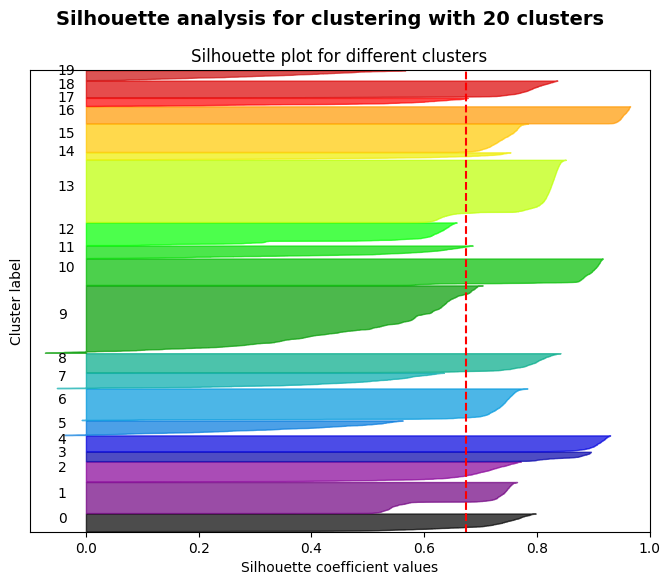

Adjusted Rand Index: 0.5366342409871032
Adjusted Mutual Information: 0.7641216173900158


In [23]:
max_iterations = 100
k = 20

kmeans = KMeans(x_train, k)
centroids, clusters = kmeans.fit(max_iterations)

# Convertir clusters a un array
cluster_labels = np.zeros(x_train.shape[0])
for cluster, points in clusters.items():
    for point in points:
        index = np.where((x_train == point).all(axis=1))[0]
        cluster_labels[index] = cluster

# MÉTRICAS EN TRAIN
# 1. Silhouette Score
silhouette_avg = silhouette_score(x_train, cluster_labels)
plot_silhouette(x_train, cluster_labels, n_clusters=k)
# 2. Rand Index
rand_index = adjusted_rand_score(y_train, cluster_labels)
print(f"Adjusted Rand Index: {rand_index}")
# 3. Mutual Information
mutual_info = adjusted_mutual_info_score(y_train, cluster_labels)
print(f"Adjusted Mutual Information: {mutual_info}")

For n_clusters = 7, the average silhouette score is: 0.327281653881073


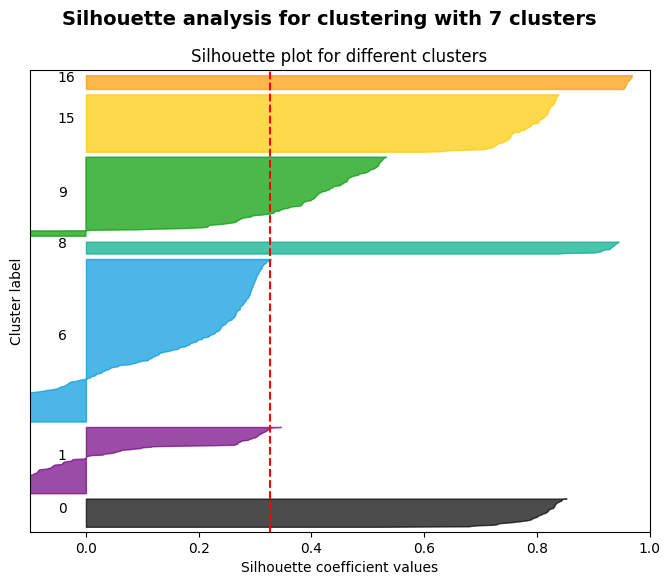

Adjusted Rand Index: 0.16106972260394642
Adjusted Mutual Information: 0.4366936296774058


In [24]:

y_predict = [kmeans.predict(x_v) for x_v in x_val]

# MÉTRICAS EN VALIDATION
# 1. Silhouette Score
silhouette_avg = silhouette_score(x_val, y_predict)
plot_silhouette(x_val, y_predict, n_clusters=k)
# 2. Rand Index
rand_index = adjusted_rand_score(y_val, y_predict)
print(f"Adjusted Rand Index: {rand_index}")
# 3. Mutual Information
mutual_info = adjusted_mutual_info_score(y_val, y_predict)
print(f"Adjusted Mutual Information: {mutual_info}")

For n_clusters = 6, the average silhouette score is: 0.32181498408317566


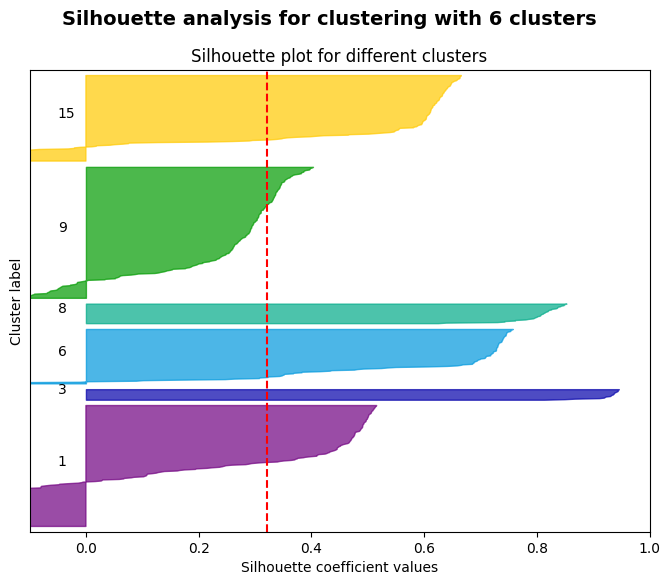

In [25]:
y_predict_kmeans = [kmeans.predict(x_t) for x_t in x_test]

# MÉTRICAS EN TEST
# 1. Silhouette Score
silhouette_avg = silhouette_score(x_test, y_predict_kmeans)
plot_silhouette(x_test, y_predict_kmeans, n_clusters=k)

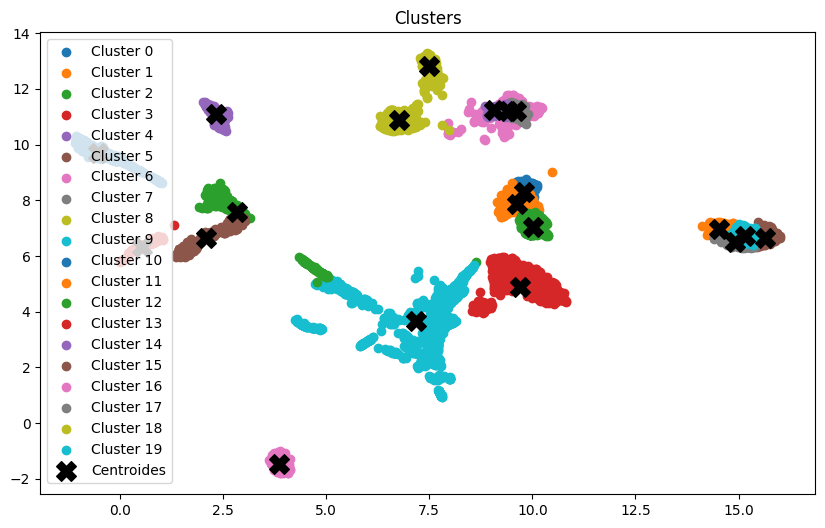

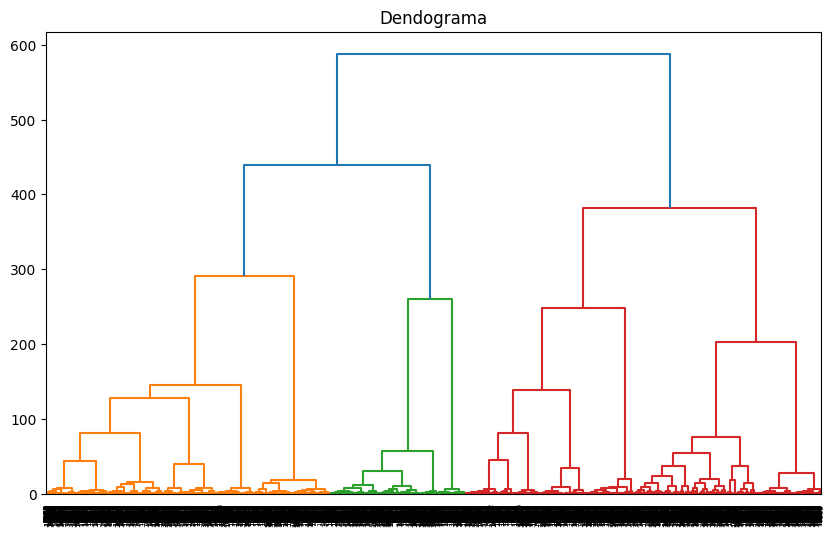

In [26]:

# Suponiendo que 'pca_principal_components' ya ha sido calculado
data_for_clustering = np.vstack(x_train)

# Visualizar los clusters
plt.figure(figsize=(10, 6))
for cluster in range(k):
    cluster_points = data_for_clustering[cluster_labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster}')
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', color='black', s=200, label='Centroides')
plt.legend()
plt.title('Clusters')
plt.show()

# Dendograma
linked = linkage(data_for_clustering, 'ward')
plt.figure(figsize=(10, 6))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Dendograma')
plt.show()

Para x_test

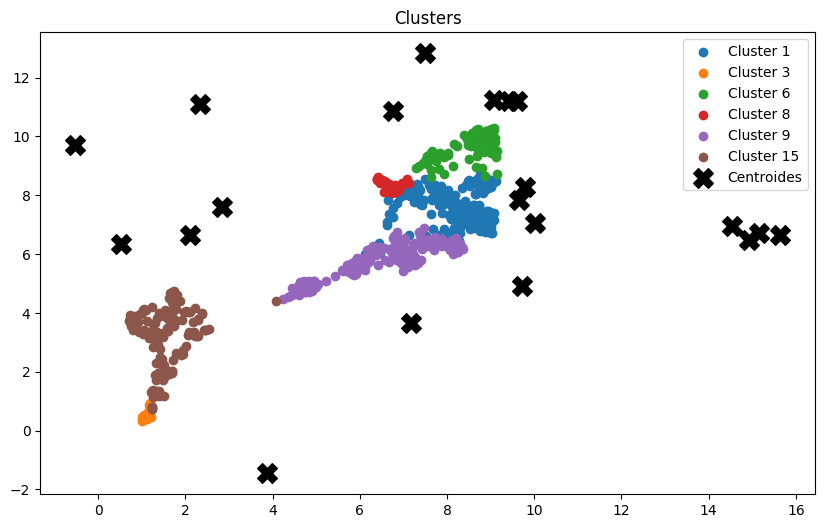

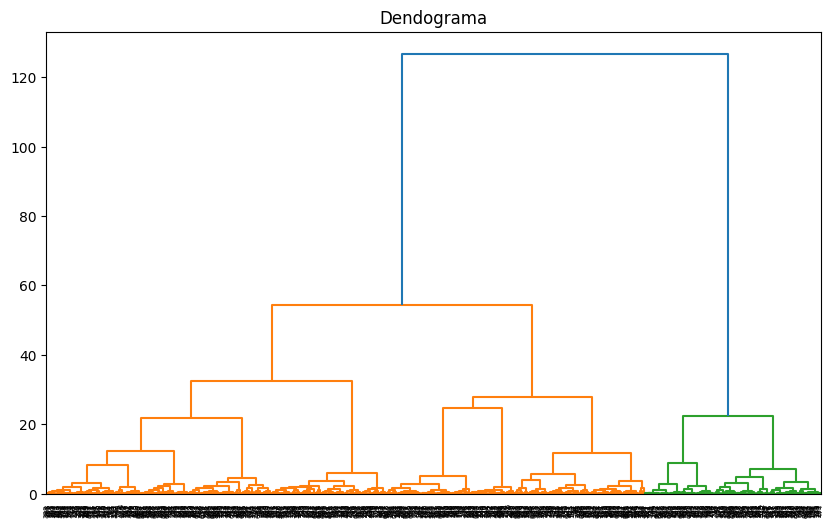

In [28]:
# Suponiendo que 'pca_principal_components' ya ha sido calculado
data_for_clustering = np.vstack(x_test)

# Visualizar los clusters
plt.figure(figsize=(10, 6))
for cluster in np.unique(y_predict_kmeans):
    cluster_points = data_for_clustering[y_predict_kmeans == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster}')
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', color='black', s=200, label='Centroides')
plt.legend()
plt.title('Clusters')
plt.show()

# Dendograma
linked = linkage(data_for_clustering, 'ward')
plt.figure(figsize=(10, 6))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Dendograma')
plt.show()

## 3.2. Para DBSCAN

For n_clusters = 17, the average silhouette score is: 0.6890283226966858


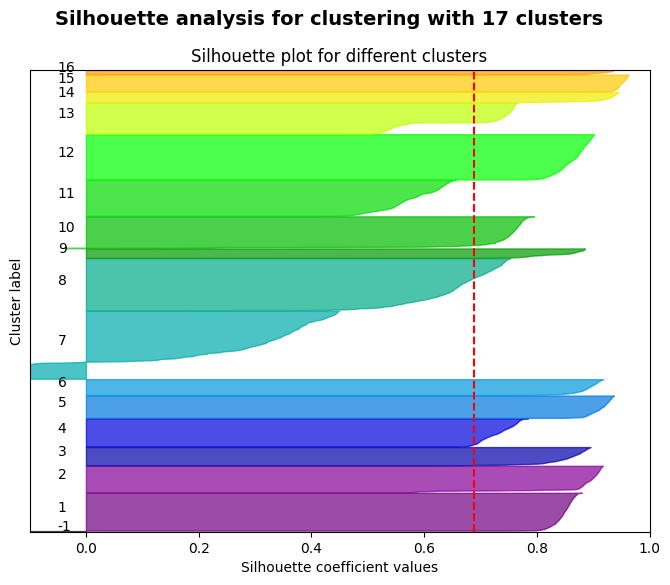

Adjusted Rand Index: 0.5536969140841665
Adjusted Mutual Information: 0.7628461420471738


In [35]:
radio = 0.5
vecinos_min = 4

dbscan = DBSCAN(radio, vecinos_min)
cluster_labels_dbscan = dbscan.fit(x_train)

# MÉTRICAS EN TRAIN
# 1. Silhouette Score
silhouette_avg = silhouette_score(x_train, cluster_labels_dbscan)
plot_silhouette(x_train, cluster_labels_dbscan, n_clusters=k)
# 2. Rand Index
rand_index = adjusted_rand_score(y_train, cluster_labels_dbscan)
print(f"Adjusted Rand Index: {rand_index}")
# 3. Mutual Information
mutual_info = adjusted_mutual_info_score(y_train, cluster_labels_dbscan)
print(f"Adjusted Mutual Information: {mutual_info}")

For n_clusters = 4, the average silhouette score is: -0.33324652910232544


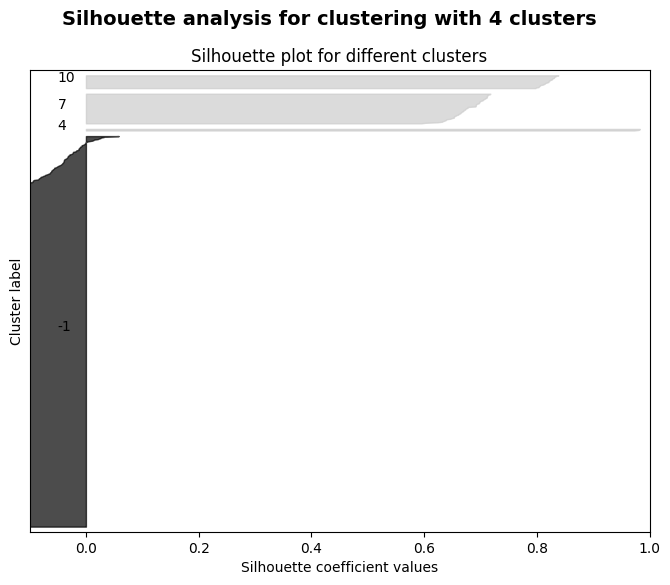

Adjusted Rand Index: 0.008539826516222352
Adjusted Mutual Information: 0.11674173619869214


In [36]:
y_predict = [dbscan.predict(x_v) for x_v in x_val]

# MÉTRICAS EN VALIDATION
# 1. Silhouette Score
silhouette_avg = silhouette_score(x_val, y_predict)
plot_silhouette(x_val, y_predict, n_clusters=4)
# 2. Rand Index
rand_index = adjusted_rand_score(y_val, y_predict)
print(f"Adjusted Rand Index: {rand_index}")
# 3. Mutual Information
mutual_info = adjusted_mutual_info_score(y_val, y_predict)
print(f"Adjusted Mutual Information: {mutual_info}")

For n_clusters = 2, the average silhouette score is: -0.11170011013746262


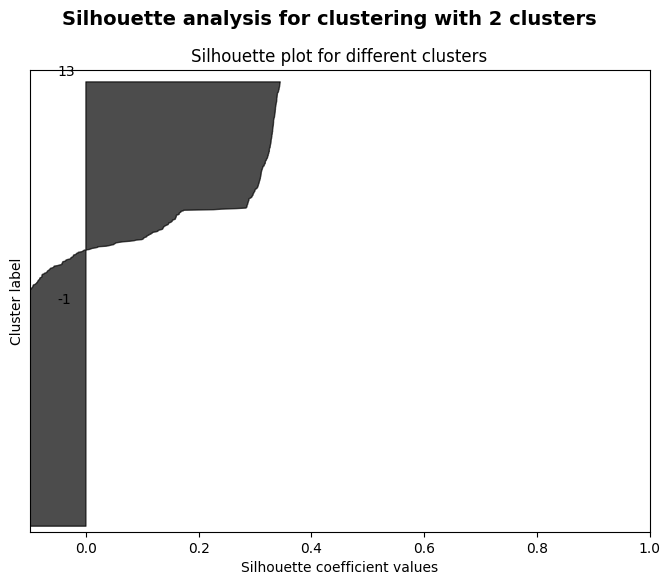

In [37]:
y_predict_dbscan = [dbscan.predict(x_t) for x_t in x_test]

# MÉTRICAS EN TEST
# 1. Silhouette Score
silhouette_avg = silhouette_score(x_test, y_predict_dbscan)
plot_silhouette(x_test, y_predict_dbscan, n_clusters=k)

**Generar csv prediction**

In [ ]:
import pandas as pd

df = pd.DataFrame({
    'youtube_id': arr_test_reorder,
    'label': y_predict_kmeans
})
df.to_csv('submission_v1.csv', index=False)

df = pd.DataFrame({
    'youtube_id': arr_test_reorder,
    'label': y_predict_dbscan
})

df.to_csv('submission_v2.csv', index=False)